## 教你6步绘制青岛地铁线路图

随着2021年12月30日青岛地铁1号线南段正式开通运营，青黄不接再一次告别历史，隧道+地铁的双线交通必将青黄拉得更近了。青岛地铁运营里程也来到了293.1公里，跻身大陆城市地铁排名10强，但由于11和13号线郊区段较长，外加疫情原因导致机场8号线客流较少，导致青岛地铁虽然里程排名第10，但客流强度一直感人。

借由青岛地铁1号线南段开通之际及部分微信群友们对最新版地铁线路图的渴求，作为一个入门级GIS爱好者决定试一试，画一份最新版地铁线路图供大家参考。`主要目标为按照青岛地铁标准配色叠加地形图或街道图绘制带站名的地铁线路图，并保存为png或jpg格式以方便保存共享`。

经过近2个月的摸鱼，知道了[Shapefile](https://zh.wikipedia.org/wiki/Shapefile)、[GeoJSON](https://geojson.org/)文件格式及QGIS等一众工具，并最终从[OpenStreetMap](https://www.openstreetmap.org/#map=9/36.1551/120.6746)网站下载到了全国矢量数据，导入QGIS后初步确认数据包含青岛地铁1号线南段。然后从https://hxkj.vip/demo/echartsMap/ 网站获取了最新版青岛市区划geojson数据。这样后续用到的基础数据基本齐了。

然后就是可视化工具的选择，结合2020年疫情回国隔离期间学习绘制归国航迹路线图的经历，首先尝试[Folium](https://python-visualization.github.io/folium/)库，但由于无法将地图保存为静态图，遂放弃。matplotlib+[basemap](https://matplotlib.org/basemap/)组合由于底图不够清晰，遂放弃。然后又搜到了[geopandas](https://geopandas.org/en/stable/)，在[pandas](https://pandas.pydata.org/)基础上添加了`geometry`属性，便于储存和处理矢量数据，研究学习发现可以很好的满足线路轮廓的绘制，而且数据处理起来也非常方便，剩下的就是如何叠加底图了，在此要感谢这篇博文[geopandas轻松叠加在线底图](https://blog.51cto.com/u_15064641/2598479)，从中学到了[contextily](https://contextily.readthedocs.io/en/latest/)库，完美解决了底图问题。

数据和绘制方案确定后，下面就到了动手撸码环节了。

### 00 导入要用到的工具库

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import contextily as cx

Duplicate key in file PosixPath('/home/bobcat/miniconda3/envs/option/lib/python3.9/site-packages/matplotlib/mpl-data/matplotlibrc'), line 264 ('font.family:  sans-serif')
Duplicate key in file PosixPath('/home/bobcat/miniconda3/envs/option/lib/python3.9/site-packages/matplotlib/mpl-data/matplotlibrc'), line 272 ('font.sans-serif: DejaVu Sans, Bitstream Vera Sans, Computer Modern Sans Serif, Lucida Grande, Verdana, Geneva, Lucid, Arial, Helvetica, Avant Garde, sans-serif')
Duplicate key in file PosixPath('/home/bobcat/miniconda3/envs/option/lib/python3.9/site-packages/matplotlib/mpl-data/matplotlibrc'), line 412 ('axes.unicode_minus: True  # use Unicode for the minus symbol rather than hyphen.  See')


以下为解决`matplotlib`中文乱码的配置方案，WSL下完整解决方案可参考[wsl安装字体与配置mlt](https://liuyang0001.gitee.io/2020/07/30/wsl%E5%AE%89%E8%A3%85SimHei%E5%AD%97%E4%BD%93/)

In [2]:
#coding:utf-8
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False #正常显示负号
#有中文的情况，需要u'内容'
from matplotlib_scalebar.scalebar import ScaleBar

### 01 数据处理及首次绘图尝试

由于`contextily`库要求投影为web墨卡托即EPSG:3857，因此在数据读取环节需要变换[crs](https://www.osgeo.cn/qgisdoc/docs/gentle_gis_introduction/coordinate_reference_systems.html)，但采用`EPSG:3857`后`geopandas`的`geometry`将不再是显性的经纬度坐标，如果不需要叠加底图的小伙伴可以取消转换。

In [3]:
#railway_data = gpd.read_file('gis_osm_railways_free_1.shp').to_crs('EPSG:3857')
railway_data = gpd.read_file('gis_osm_railways_free_1.shp')
railway_data.head()

,osm_id,code,fclass,name,layer,bridge,tunnel,geometry
0,4181592,6103,subway,港鐵機場快綫 MTR Airport Express,1,T,F,"LINESTRING (113.94339 22.32225, 113.94222 22.3..."
1,4181898,6103,subway,大嶼山及機場鐵路 Lantau and Airport Railway,-2,F,T,"LINESTRING (114.05075 22.34109, 114.05044 22.3..."
2,4182662,6103,subway,港鐵機場快綫 MTR Airport Express,2,T,F,"LINESTRING (114.12591 22.34832, 114.12518 22.3..."
3,4338940,6108,funicular,山頂纜車 Peak Tram,0,F,F,"LINESTRING (114.14999 22.27114, 114.15014 22.2..."
4,4959070,6103,subway,港鐵機場快綫 MTR Airport Express,0,F,F,"LINESTRING (113.96220 22.29779, 113.96138 22.2..."


In [4]:
print(railway_data.crs)

epsg:4326


In [5]:
railway_data = railway_data.to_crs('EPSG:3857')
railway_data.head()

,osm_id,code,fclass,name,layer,bridge,tunnel,geometry
0,4181592,6103,subway,港鐵機場快綫 MTR Airport Express,1,T,F,"LINESTRING (12684119.976 2550259.714, 12683989..."
1,4181898,6103,subway,大嶼山及機場鐵路 Lantau and Airport Railway,-2,F,T,"LINESTRING (12696071.793 2552526.841, 12696036..."
2,4182662,6103,subway,港鐵機場快綫 MTR Airport Express,2,T,F,"LINESTRING (12704438.021 2553396.971, 12704356..."
3,4338940,6108,funicular,山頂纜車 Peak Tram,0,F,F,"LINESTRING (12707118.761 2544109.678, 12707135..."
4,4959070,6103,subway,港鐵機場快綫 MTR Airport Express,0,F,F,"LINESTRING (12686214.274 2547316.028, 12686122..."


In [6]:
railway_data['fclass'].unique()

array(['subway', 'funicular', 'rail', 'monorail', 'tram', 'light_rail',
       'narrow_gauge', 'miniature_railway'], dtype=object)

通过`fclass`等于`subway`来筛选地铁线路

In [7]:
metro_data = railway_data[railway_data['fclass'] == 'subway']

In [8]:
metro_data.head()

,osm_id,code,fclass,name,layer,bridge,tunnel,geometry
0,4181592,6103,subway,港鐵機場快綫 MTR Airport Express,1,T,F,"LINESTRING (12684119.976 2550259.714, 12683989..."
1,4181898,6103,subway,大嶼山及機場鐵路 Lantau and Airport Railway,-2,F,T,"LINESTRING (12696071.793 2552526.841, 12696036..."
2,4182662,6103,subway,港鐵機場快綫 MTR Airport Express,2,T,F,"LINESTRING (12704438.021 2553396.971, 12704356..."
4,4959070,6103,subway,港鐵機場快綫 MTR Airport Express,0,F,F,"LINESTRING (12686214.274 2547316.028, 12686122..."
5,4959071,6103,subway,港鐵機場快綫 MTR Airport Express,1,T,F,"LINESTRING (12683714.662 2546652.774, 12683690..."


In [9]:
metro_data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 15754 entries, 0 to 255710
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   osm_id    15754 non-null  object  
 1   code      15754 non-null  int64   
 2   fclass    15754 non-null  object  
 3   name      3883 non-null   object  
 4   layer     15754 non-null  int64   
 5   bridge    15754 non-null  object  
 6   tunnel    15754 non-null  object  
 7   geometry  15754 non-null  geometry
dtypes: geometry(1), int64(2), object(5)
memory usage: 1.1+ MB


初步选取青岛地铁线路，此处有一点需要注意，鉴于各地对地铁名称上的区别，上述`name`属性值中有青岛地铁XX线或上海轨道交通XX线或首都机场线甚至None（空值）等名称，确切的说在总计`15754`行数据中非空值仅为`3883`行。。。因此建议直接按`name`属性包含城市来筛选某一城市的地铁线路。后面会有更方便的方法筛选某一城市的地铁线路。

In [10]:
metro_data_qingdao = metro_data.loc[metro_data['name'].str.contains('青岛', na=False)]

In [11]:
metro_data_qingdao.to_crs('EPSG:3857')

,osm_id,code,fclass,name,layer,bridge,tunnel,geometry
113007,525096788,6103,subway,青岛地铁11号线,1,T,F,"LINESTRING (13434685.565 4357926.229, 13434579..."
113008,525096789,6103,subway,青岛地铁11号线,0,F,F,"LINESTRING (13434685.565 4357926.229, 13435162..."
113009,525096790,6103,subway,青岛地铁11号线,-1,F,T,"LINESTRING (13435162.468 4358027.418, 13435314..."
113010,525096792,6103,subway,青岛地铁11号线,1,T,F,"LINESTRING (13436069.667 4358429.543, 13436133..."
117672,546414706,6103,subway,青岛地铁2号线,-3,F,T,"LINESTRING (13398750.319 4310270.586, 13398803..."
...,...,...,...,...,...,...,...,...
244000,971320881,6103,subway,青岛地铁8号线,0,F,F,"LINESTRING (13370397.212 4345229.232, 13370516..."
244001,971320882,6103,subway,青岛地铁8号线,1,T,F,"LINESTRING (13370516.702 4344889.635, 13370707..."
244002,971341939,6103,subway,青岛地铁8号线,2,T,F,"LINESTRING (13371075.003 4342493.090, 13371131..."
244003,971341940,6103,subway,青岛地铁8号线,1,T,F,"LINESTRING (13371131.764 4342272.025, 13371261..."


In [12]:
metro_data_qingdao['name'].unique()

array(['青岛地铁11号线', '青岛地铁2号线', '青岛地铁 8号线', '青岛地铁13号线', '青岛地铁1号线',
       '青岛地铁8号线'], dtype=object)

以上我们可以看到经过初步筛选后的数据中并没有包含青岛地铁3号线，因此对3号线要进行特殊处理。

In [13]:
metro_data_qingdao_3 = metro_data.loc[metro_data['name'] == '地铁3号线']

In [14]:
metro_data_qingdao_3.to_crs('EPSG:4326')

,osm_id,code,fclass,name,layer,bridge,tunnel,geometry
22010,187491086,6103,subway,地铁3号线,0,F,F,"LINESTRING (122.00179 39.08580, 122.00090 39.0..."
22452,188216331,6103,subway,地铁3号线,1,F,F,"LINESTRING (121.71137 39.03358, 121.71195 39.0..."
34765,232259055,6103,subway,地铁3号线,0,F,F,"LINESTRING (121.99392 39.08348, 121.99682 39.0..."
37370,241123365,6103,subway,地铁3号线,1,T,F,"LINESTRING (121.71137 39.03362, 121.71113 39.0..."
37374,241123369,6103,subway,地铁3号线,0,F,F,"LINESTRING (121.69950 39.03407, 121.69858 39.0..."
39243,249199056,6103,subway,地铁3号线,-2,F,T,"LINESTRING (115.97103 28.69634, 115.96805 28.6..."
42091,256679071,6103,subway,地铁3号线,-5,F,T,"LINESTRING (120.30980 36.06364, 120.31109 36.0..."
47178,277989211,6103,subway,地铁3号线,-3,F,T,"LINESTRING (102.77407 25.03894, 102.77364 25.0..."
47179,277989212,6103,subway,地铁3号线,-3,F,T,"LINESTRING (102.71782 25.04107, 102.71776 25.0..."
51338,293631319,6103,subway,地铁3号线,-2,F,T,"LINESTRING (109.02021 34.31249, 109.01798 34.3..."


对青岛市经纬度范围熟悉的话，我们可以人肉筛选出`osm_id = 256679071`的三号线可能为青岛地铁号线。

In [15]:
metro_data_qingdao_3 = metro_data_qingdao_3[metro_data_qingdao_3['osm_id'] == '256679071']

In [16]:
metro_data_qingdao_3

,osm_id,code,fclass,name,layer,bridge,tunnel,geometry
42091,256679071,6103,subway,地铁3号线,-5,F,T,"LINESTRING (13392826.085 4309382.184, 13392969..."


读取青岛市区划范围，便于展示地铁线路在各区县的分布情况。

In [17]:
geo_data_qingdao = gpd.read_file('青岛市.geojson')
geo_data_qingdao

,adcode,name,childrenNum,level,subFeatureIndex,geometry
0,370202,市南区,0,district,0,"MULTIPOLYGON (((120.41966 36.09099, 120.42227 ..."
1,370203,市北区,0,district,1,"MULTIPOLYGON (((120.41966 36.09099, 120.41096 ..."
2,370211,黄岛区,0,district,2,"MULTIPOLYGON (((119.71705 36.04185, 119.72035 ..."
3,370212,崂山区,0,district,3,"MULTIPOLYGON (((120.48449 36.21575, 120.48631 ..."
4,370213,李沧区,0,district,4,"MULTIPOLYGON (((120.34344 36.20834, 120.34920 ..."
5,370214,城阳区,0,district,5,"MULTIPOLYGON (((120.57066 36.32737, 120.57032 ..."
6,370215,即墨区,0,district,6,"MULTIPOLYGON (((120.65604 36.32216, 120.65379 ..."
7,370281,胶州市,0,district,7,"MULTIPOLYGON (((119.71705 36.04185, 119.71728 ..."
8,370283,平度市,0,district,8,"MULTIPOLYGON (((120.00808 36.49822, 120.01034 ..."
9,370285,莱西市,0,district,9,"MULTIPOLYGON (((120.63445 36.58900, 120.62719 ..."


In [18]:
geo_data_qingdao = geo_data_qingdao.to_crs('EPSG:3857')
geo_data_qingdao

,adcode,name,childrenNum,level,subFeatureIndex,geometry
0,370202,市南区,0,district,0,"MULTIPOLYGON (((13405055.233 4313148.827, 1340..."
1,370203,市北区,0,district,1,"MULTIPOLYGON (((13405055.233 4313148.827, 1340..."
2,370211,黄岛区,0,district,2,"MULTIPOLYGON (((13326840.823 4306381.397, 1332..."
3,370212,崂山区,0,district,3,"MULTIPOLYGON (((13412272.298 4330349.269, 1341..."
4,370213,李沧区,0,district,4,"MULTIPOLYGON (((13396570.350 4329326.770, 1339..."
5,370214,城阳区,0,district,5,"MULTIPOLYGON (((13421864.476 4345761.535, 1342..."
6,370215,即墨区,0,district,6,"MULTIPOLYGON (((13431368.600 4345041.533, 1343..."
7,370281,胶州市,0,district,7,"MULTIPOLYGON (((13326840.823 4306381.397, 1332..."
8,370283,平度市,0,district,8,"MULTIPOLYGON (((13359238.023 4369394.431, 1335..."
9,370285,莱西市,0,district,9,"MULTIPOLYGON (((13428965.769 4381972.201, 1342..."


经过上述数据处理后，下面开始首次尝试绘制青岛地铁图，既然属于GIS范畴，我们就以叠加地形图为主。

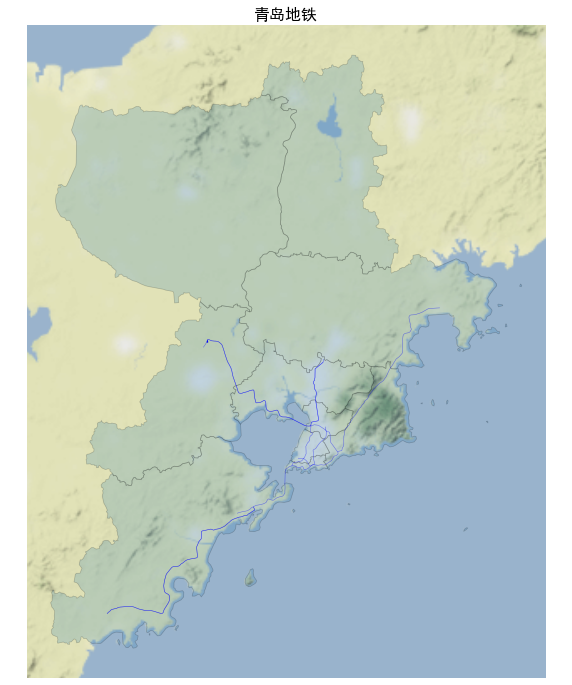

In [19]:
figure = plt.figure(figsize=(10, 12))

plt.title('青岛地铁', fontsize=16)
plt.axis('off')

axes1 = figure.add_subplot(1,1,1)
axes1.axis('off')

# zorder值越大，则在叠加图层中越靠上，即不会被zorder值小的图层所覆盖。
metro_data_qingdao.plot(ax=axes1, alpha=0.5, edgecolor='k', linewidth=0.5, zorder=10, color='blue')
metro_data_qingdao_3.plot(ax=axes1, alpha=0.5, edgecolor='k', linewidth=0.5, zorder=10, color='blue')

geo_data_qingdao.plot(ax=axes1, alpha=0.2, edgecolor='k', linewidth=0.7, zorder=5)

cx.add_basemap(ax=axes1, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)
#zoom值越大则底图越清晰，考虑到网络问题，建议不要取太大值

figure.savefig('青岛地铁1.png', pad_inches=0, bbox_inches='tight', dpi=300)

通过上图我们可以看到线路轮廓大致与真实路线一致，但由于线路数据的重叠，导致各线路粗细不均。不过好歹我们完成了第一步。下面我们将不断在此基础上进行改进。

### 02 `name`属性空值处理

In [20]:
metro_data_NA = metro_data.loc[metro_data['name'].str.contains('None', na=True)]

In [21]:
metro_data_NA

,osm_id,code,fclass,name,layer,bridge,tunnel,geometry
11,12247578,6103,subway,None,2,T,F,"LINESTRING (13522528.476 3668117.476, 13522515..."
20,24818634,6103,subway,None,0,F,F,"LINESTRING (12935057.519 4851003.935, 12935055..."
120,25041427,6103,subway,None,-1,F,T,"LINESTRING (12945731.689 4875250.410, 12945743..."
121,25041428,6103,subway,None,0,F,F,"LINESTRING (12946258.764 4876122.836, 12946322..."
255,26307143,6103,subway,None,1,T,F,"LINESTRING (12951721.635 4857189.292, 12951696..."
...,...,...,...,...,...,...,...,...
255526,1016757775,6103,subway,None,0,F,F,"LINESTRING (14092744.155 5728619.137, 14092711..."
255527,1016757777,6103,subway,None,0,F,F,"LINESTRING (14092540.541 5728642.509, 14092471..."
255528,1016757778,6103,subway,None,0,F,F,"LINESTRING (14092607.566 5728643.704, 14092540..."
255529,1016757779,6103,subway,None,0,F,F,"LINESTRING (14092559.198 5728648.627, 14092429..."


借助`geopandas`的`clip`函数，我们可以裁切`geo_data_qingdao`范围内的`metro_data`数据。

In [22]:
metro_data_qingdao_clip = gpd.clip(metro_data, geo_data_qingdao)
metro_data_qingdao_clip = metro_data_qingdao_clip[~metro_data_qingdao_clip.is_empty]
metro_data_qingdao_clip

,osm_id,code,fclass,name,layer,bridge,tunnel,geometry
136279,624654571,6103,subway,青岛地铁13号线,-1,F,T,"LINESTRING (13363563.052 4285909.352, 13363840..."
136280,624654579,6103,subway,青岛地铁13号线,-1,F,T,"LINESTRING (13363562.496 4285922.131, 13363844..."
244003,971341940,6103,subway,青岛地铁8号线,1,T,F,"LINESTRING (13371131.764 4342272.025, 13371261..."
186269,794361559,6103,subway,青岛地铁8号线,1,T,F,"LINESTRING (13371140.002 4342273.986, 13371272..."
244002,971341939,6103,subway,青岛地铁8号线,2,T,F,"LINESTRING (13371075.003 4342493.090, 13371131..."
...,...,...,...,...,...,...,...,...
113008,525096789,6103,subway,青岛地铁11号线,0,F,F,"LINESTRING (13434685.565 4357926.229, 13435162..."
113009,525096790,6103,subway,青岛地铁11号线,-1,F,T,"LINESTRING (13435162.468 4358027.418, 13435314..."
242415,968613224,6103,subway,青岛地铁11号线,0,F,F,"LINESTRING (13435762.692 4358187.193, 13435843..."
113010,525096792,6103,subway,青岛地铁11号线,1,T,F,"LINESTRING (13436069.667 4358429.543, 13436133..."


In [23]:
metro_data_qingdao_NA = metro_data_qingdao_clip.loc[metro_data_qingdao_clip['name'].str.contains('None', na=True)]
metro_data_qingdao_NA

,osm_id,code,fclass,name,layer,bridge,tunnel,geometry
174103,757389184,6103,subway,None,-1,F,T,"LINESTRING (13408261.223 4316192.981, 13408231..."
174199,757423447,6103,subway,None,1,T,F,"LINESTRING (13412059.589 4321189.183, 13412074..."
174128,757415691,6103,subway,None,1,T,F,"LINESTRING (13399359.949 4321350.204, 13399371..."
174130,757415693,6103,subway,None,1,T,F,"LINESTRING (13399353.972 4321354.616, 13399364..."
174133,757415696,6103,subway,None,1,T,F,"LINESTRING (13399388.904 4321616.171, 13399393..."
...,...,...,...,...,...,...,...,...
127296,583560520,6103,subway,None,1,T,F,"LINESTRING (13439233.277 4365083.339, 13439583..."
91477,408251063,6103,subway,None,-5,F,T,"LINESTRING (13399369.345 4323895.906, 13399233..."
143427,654126305,6103,subway,None,0,F,F,"LINESTRING (13404261.836 4348506.511, 13404310..."
200314,836982049,6103,subway,None,1,T,F,"LINESTRING (13403907.440 4349596.099, 13404114..."


看下这些`name`为None的线路都是什么。

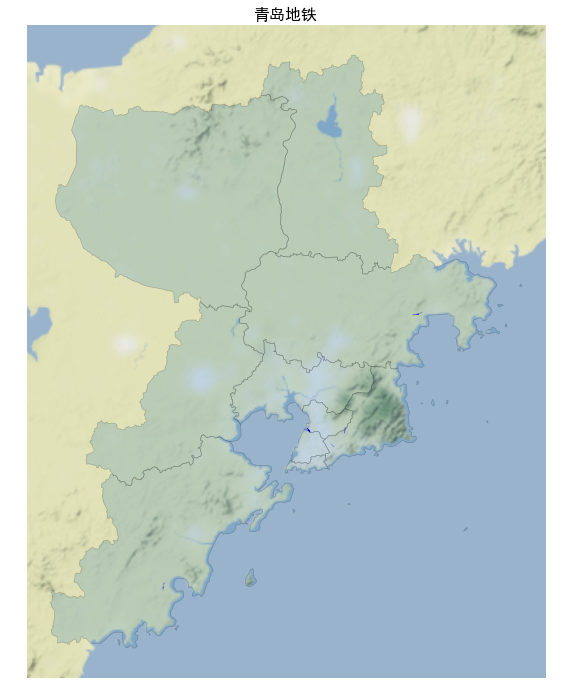

In [24]:
figure = plt.figure(figsize=(10, 12))

plt.title('青岛地铁', fontsize=16)
plt.axis('off')

axes1 = figure.add_subplot(1,1,1)
axes1.axis('off')

metro_data_qingdao_NA.plot(ax=axes1, alpha=0.5, edgecolor='k', linewidth=0.5, zorder=10, color='blue')

geo_data_qingdao.plot(ax=axes1, alpha=0.2, edgecolor='k', linewidth=0.7, zorder=5)

cx.add_basemap(ax=axes1, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)

figure.savefig('青岛地铁2-0.png', pad_inches=0, bbox_inches='tight', dpi=300)

目测主要应该是些停车场之类的，对主干线路绘图影响有限，可以忽略。

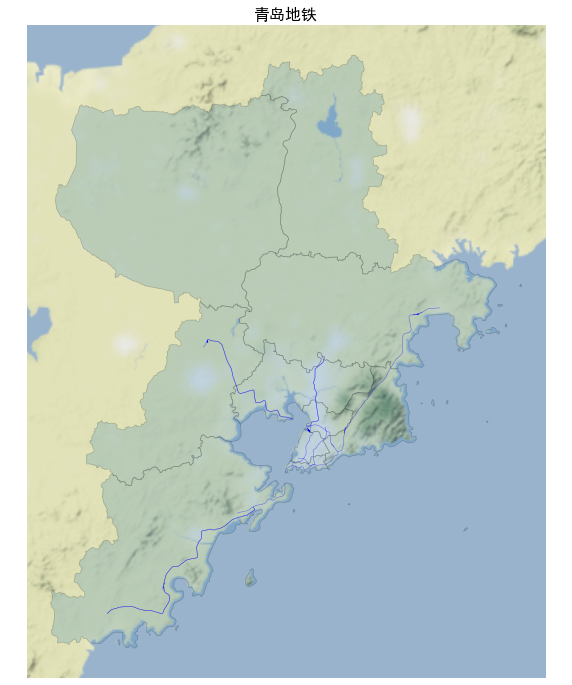

In [25]:
figure = plt.figure(figsize=(10, 12))

plt.title('青岛地铁', fontsize=16)
plt.axis('off')

axes1 = figure.add_subplot(1,1,1)
axes1.axis('off')

metro_data_qingdao_clip.plot(ax=axes1, alpha=0.5, edgecolor='k', linewidth=0.5, zorder=10, color='blue')

geo_data_qingdao.plot(ax=axes1, alpha=0.2, edgecolor='k', linewidth=0.7, zorder=5)

cx.add_basemap(ax=axes1, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)

figure.savefig('青岛地铁2-1.png', pad_inches=0, bbox_inches='tight', dpi=300)

对青岛地铁而言，由于存在跨海段，且跨海段不在`geo_data_qingdao`范围内，因此`clip`裁切后的地铁线路存在跨海段缺失的问题。所以，后面我们还得继续使用上一步通过字段筛选得到的`geo_data_qingdao`。

In [26]:
metro_data_qingdao_all = metro_data_qingdao.append(metro_data_qingdao_clip)
metro_data_qingdao_all.drop_duplicates(inplace=True)
#metro_data_qingdao_all['name'].fillna('青岛地铁', inplace=True)
metro_data_qingdao_all

,osm_id,code,fclass,name,layer,bridge,tunnel,geometry
113007,525096788,6103,subway,青岛地铁11号线,1,T,F,"LINESTRING (13434685.565 4357926.229, 13434579..."
113008,525096789,6103,subway,青岛地铁11号线,0,F,F,"LINESTRING (13434685.565 4357926.229, 13435162..."
113009,525096790,6103,subway,青岛地铁11号线,-1,F,T,"LINESTRING (13435162.468 4358027.418, 13435314..."
113010,525096792,6103,subway,青岛地铁11号线,1,T,F,"LINESTRING (13436069.667 4358429.543, 13436133..."
117672,546414706,6103,subway,青岛地铁2号线,-3,F,T,"LINESTRING (13398750.319 4310270.586, 13398803..."
...,...,...,...,...,...,...,...,...
127296,583560520,6103,subway,None,1,T,F,"LINESTRING (13439233.277 4365083.339, 13439583..."
91477,408251063,6103,subway,None,-5,F,T,"LINESTRING (13399369.345 4323895.906, 13399233..."
143427,654126305,6103,subway,None,0,F,F,"LINESTRING (13404261.836 4348506.511, 13404310..."
200314,836982049,6103,subway,None,1,T,F,"LINESTRING (13403907.440 4349596.099, 13404114..."


这样`metro_data_qingdao_all`就包含了要绘制的所有数据。

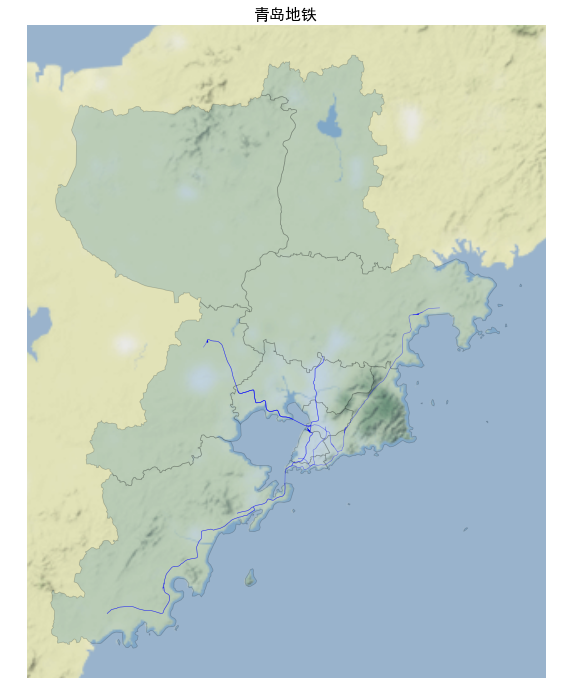

In [27]:
figure = plt.figure(figsize=(10, 12))

plt.title('青岛地铁', fontsize=16)
plt.axis('off')

axes1 = figure.add_subplot(1,1,1)
axes1.axis('off')

metro_data_qingdao_all.plot(ax=axes1, alpha=0.5, edgecolor='k', linewidth=0.5, zorder=10, color='blue')

geo_data_qingdao.plot(ax=axes1, alpha=0.2, edgecolor='k', linewidth=0.7, zorder=5)

cx.add_basemap(ax=axes1, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)

figure.savefig('青岛地铁2-2.png', pad_inches=0, bbox_inches='tight', dpi=300)

### 03 地铁线路配色

以上2步我们重点探讨了如何进行数据处理，同时用单一色彩`蓝色`绘制出了青岛地铁线路图。我们能否根据青岛地铁线路标准配色来为我们的线路进行上色呢？为此我们首先要把地铁线路名称进行统一。

In [28]:
metro_data_qingdao_all['name'].unique()

array(['青岛地铁11号线', '青岛地铁2号线', '青岛地铁 8号线', '青岛地铁13号线', '青岛地铁1号线',
       '青岛地铁8号线', None, '地铁3号线'], dtype=object)

In [29]:
metro_data_qingdao_all['name'] = metro_data_qingdao_all['name'].str.replace('地铁3号线','青岛地铁3号线')

metro_data_qingdao_all['name'] = metro_data_qingdao_all['name'].str.replace('青岛地铁 8号线','青岛地铁8号线')
#metro_data_qingdao_all['name'].replace('\s+', '', regex=True, inplace=True)

metro_data_qingdao_all['name'].unique()

array(['青岛地铁11号线', '青岛地铁2号线', '青岛地铁8号线', '青岛地铁13号线', '青岛地铁1号线', None,
       '青岛地铁3号线'], dtype=object)

通过在`geopandas.plot()`方法中设置`column='name'`和`categorical=True`，`geopandas.plot()`会根据`column`列的不同值进行自动配色。

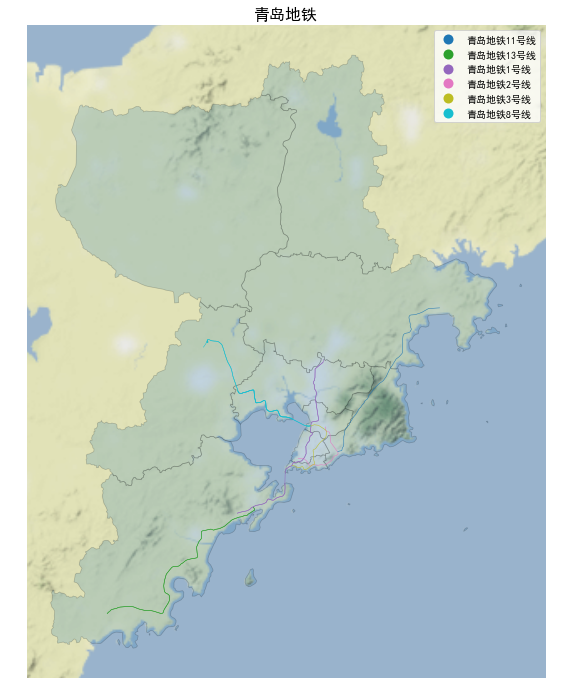

In [30]:
figure = plt.figure(figsize=(10, 12))

plt.title('青岛地铁', fontsize=16)
plt.axis('off')

axes1 = figure.add_subplot(1,1,1)
axes1.axis('off')

metro_data_qingdao_all.plot(ax=axes1, column='name', categorical=True, legend=True, linewidth=0.5, zorder=10)

geo_data_qingdao.plot(ax=axes1, alpha=0.2, edgecolor='k', linewidth=0.7, zorder=5)

cx.add_basemap(ax=axes1, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)

figure.savefig('青岛地铁3-0.png', pad_inches=0, bbox_inches='tight', dpi=300)

感谢这篇博文[Lesson 2. Customize Map Legends and Colors in Python using Matplotlib: GIS in Python](https://www.earthdatascience.org/courses/scientists-guide-to-plotting-data-in-python/plot-spatial-data/customize-vector-plots/python-customize-map-legends-geopandas/)提供的自定义配色的现成方法。青岛地铁线路标准配色可参考[青岛地铁颜色](https://zh.wikipedia.org/wiki/Template:%E9%9D%92%E5%B2%9B%E5%9C%B0%E9%93%81%E9%A2%9C%E8%89%B2)。

In [31]:
metro_qingdao_color = pd.read_excel('metro_qingdao_color.xlsx')
metro_qingdao_color

,Lines,Color
0,青岛地铁1号线,#EAAA00
1,青岛地铁2号线,#AF272F
2,青岛地铁3号线,#0057B8
3,青岛地铁4号线,#007A33
4,青岛地铁5号线,#981D97
5,青岛地铁6号线,#6CACE4
6,青岛地铁7号线,#AD96DC
7,青岛地铁8号线,#DF1995
8,青岛地铁9号线,#64A70B
9,青岛地铁10号线,#844B18


In [32]:
Lines_Palette = dict([(i,a) for i,a in zip(metro_qingdao_color['Lines'], metro_qingdao_color['Color'])])
Lines_Palette

{'青岛地铁1号线': '#EAAA00',
 '青岛地铁2号线': '#AF272F',
 '青岛地铁3号线': '#0057B8',
 '青岛地铁4号线': '#007A33',
 '青岛地铁5号线': '#981D97',
 '青岛地铁6号线': '#6CACE4',
 '青岛地铁7号线': '#AD96DC',
 '青岛地铁8号线': '#DF1995',
 '青岛地铁9号线': '#64A70B',
 '青岛地铁10号线': '#844B18',
 '青岛地铁11号线': '#304299',
 '青岛地铁12号线': '#8246AF',
 '青岛地铁13号线': '#00AB84',
 '青岛地铁14号线': '#FF585D',
 '青岛地铁15号线': '#F2ACB9',
 '青岛地铁16号线': '#71DBD4'}

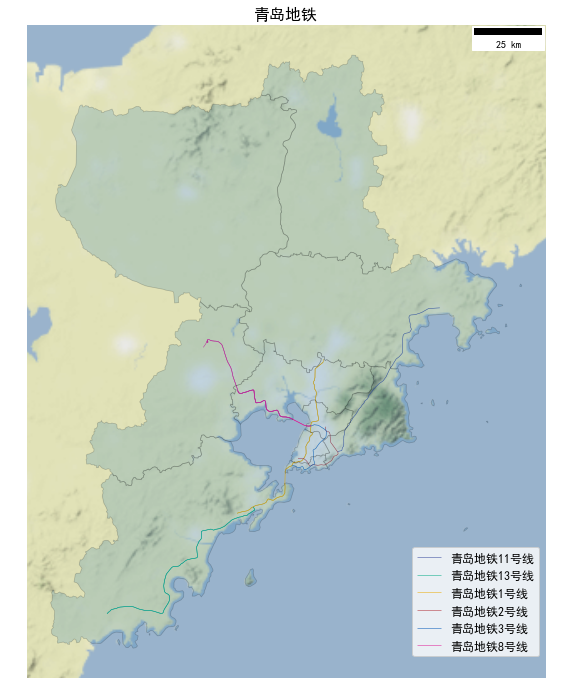

In [33]:
figure = plt.figure(figsize=(10, 12))

plt.title('青岛地铁', fontsize=16)
plt.axis('off')

axes1 = figure.add_subplot(1,1,1)
axes1.axis('off')

geo_data_qingdao.plot(ax=axes1, alpha=0.2, edgecolor='k', linewidth=0.7, zorder=5)

for ctype, data in metro_data_qingdao_all.groupby('name'):
    
    # Define the color for each group using the dictionary
    color = Lines_Palette[ctype]
    
    # Plot each group using the color defined above
    data.plot(ax=axes1, color=color, label=ctype, linewidth=0.5)
    
axes1.legend(bbox_to_anchor=(1.0, 0.21), prop={'size': 12})
axes1.add_artist(ScaleBar(1))

cx.add_basemap(ax=axes1, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)

figure.savefig('青岛地铁3-1.png', pad_inches=0, bbox_inches='tight', dpi=300)

这样我们就按照标准配色绘制出了青岛地铁线路图了，由于空值线路缺失影响不大，因此未在图中绘制。

### 04 地铁线路叠加其他城市数据

由于地铁线路与地区GDP和人口存在一定的关联性，我们自然会想能否将地铁线路与一座城市的其他数据进行叠加可视化呢？基于此想法，我们选取青岛市各区县GDP、人均GDP，常住人口及人口密度4项数据进行叠加。

In [34]:
infodata = pd.read_excel('CityData.xlsx')
infodata.rename(columns={'区划名称':'name'}, inplace=True)
infodata_qingdao = infodata[infodata['城市'] == '青岛市']
infodata_qingdao

,城市,name,面积,常住人口-,常住人口,人口密度,政府驻地,GDP,人均GDP
0,青岛市,市南区,32.21,486643,48.66,15108,香港中路街道,1400.58,28.78
1,青岛市,市北区,65.85,1096879,109.69,16657,敦化路街道,1063.56,9.70
2,青岛市,黄岛区,2128.31,1903595,190.36,894,长江路街道,4368.53,22.95
3,青岛市,崂山区,395.79,502317,50.24,1269,金家岭街道,1011.08,20.13
4,青岛市,李沧区,99.10,737281,73.73,7440,李村街道,601.21,8.15
5,青岛市,城阳区,583.68,1109606,110.69,1901,城阳街道,1334.20,12.05
6,青岛市,即墨区,1920.90,1336077,133.61,696,通济街道,1452.52,10.87
7,青岛市,胶州市,1323.65,987820,98.78,746,三里河街道,1456.27,14.74
8,青岛市,平度市,3175.65,1191348,119.13,375,凤台街道,821.14,6.89
9,青岛市,莱西市,1568.22,720103,72.01,459,水集街道,625.50,8.69


In [35]:
data_qingdao = pd.merge(geo_data_qingdao, infodata_qingdao, on='name')
data_qingdao

,adcode,name,childrenNum,level,subFeatureIndex,geometry,城市,面积,常住人口-,常住人口,人口密度,政府驻地,GDP,人均GDP
0,370202,市南区,0,district,0,"MULTIPOLYGON (((13405055.233 4313148.827, 1340...",青岛市,32.21,486643,48.66,15108,香港中路街道,1400.58,28.78
1,370203,市北区,0,district,1,"MULTIPOLYGON (((13405055.233 4313148.827, 1340...",青岛市,65.85,1096879,109.69,16657,敦化路街道,1063.56,9.70
2,370211,黄岛区,0,district,2,"MULTIPOLYGON (((13326840.823 4306381.397, 1332...",青岛市,2128.31,1903595,190.36,894,长江路街道,4368.53,22.95
3,370212,崂山区,0,district,3,"MULTIPOLYGON (((13412272.298 4330349.269, 1341...",青岛市,395.79,502317,50.24,1269,金家岭街道,1011.08,20.13
4,370213,李沧区,0,district,4,"MULTIPOLYGON (((13396570.350 4329326.770, 1339...",青岛市,99.10,737281,73.73,7440,李村街道,601.21,8.15
5,370214,城阳区,0,district,5,"MULTIPOLYGON (((13421864.476 4345761.535, 1342...",青岛市,583.68,1109606,110.69,1901,城阳街道,1334.20,12.05
6,370215,即墨区,0,district,6,"MULTIPOLYGON (((13431368.600 4345041.533, 1343...",青岛市,1920.90,1336077,133.61,696,通济街道,1452.52,10.87
7,370281,胶州市,0,district,7,"MULTIPOLYGON (((13326840.823 4306381.397, 1332...",青岛市,1323.65,987820,98.78,746,三里河街道,1456.27,14.74
8,370283,平度市,0,district,8,"MULTIPOLYGON (((13359238.023 4369394.431, 1335...",青岛市,3175.65,1191348,119.13,375,凤台街道,821.14,6.89
9,370285,莱西市,0,district,9,"MULTIPOLYGON (((13428965.769 4381972.201, 1342...",青岛市,1568.22,720103,72.01,459,水集街道,625.50,8.69


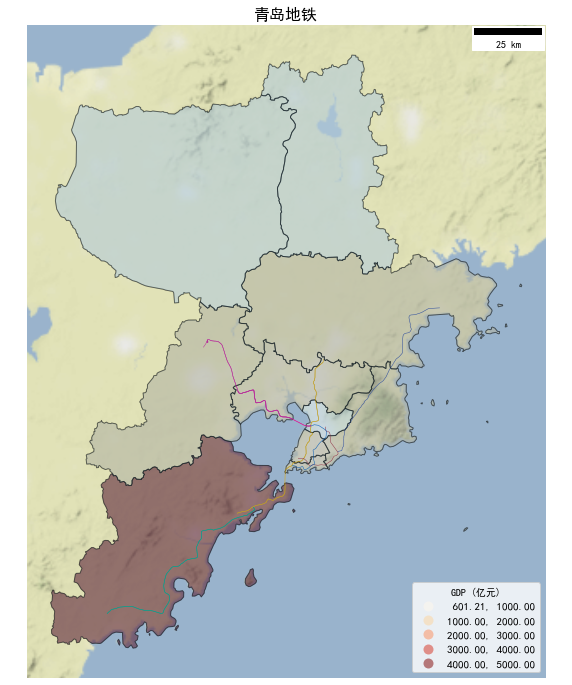

In [36]:
figure = plt.figure(figsize=(10, 12))

plt.title('青岛地铁', fontsize=16)
plt.axis('off')

axes1 = figure.add_subplot(1,1,1)
axes1.axis('off')

geo_data_qingdao.plot(ax=axes1, alpha=0.2, edgecolor='k', linewidth=0.7, zorder=5)

data_qingdao.plot(ax=axes1, column='GDP', alpha=0.5, edgecolor='k',
             categorical=False, legend=True,
             legend_kwds={'loc':'lower right', 'title':"GDP (亿元)", 'fontsize':'11'},
             scheme='User_Defined', classification_kwds=dict(bins=[1000,2000,3000,4000,5000]),
             cmap='OrRd', linewidth=1, label='GDP')

for ctype, data in metro_data_qingdao_all.groupby('name'):
    
    # Define the color for each group using the dictionary
    color = Lines_Palette[ctype]
    
    # Plot each group using the color defined above
    data.plot(ax=axes1, color=color, label=ctype, linewidth=0.5)
    
#axes1.legend(bbox_to_anchor=(1.0, 0.2), prop={'size': 11})
axes1.add_artist(ScaleBar(1))

cx.add_basemap(ax=axes1, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)

figure.savefig('青岛地铁4-0.png', pad_inches=0, bbox_inches='tight', dpi=300)

同时对上述4项数据进行叠加

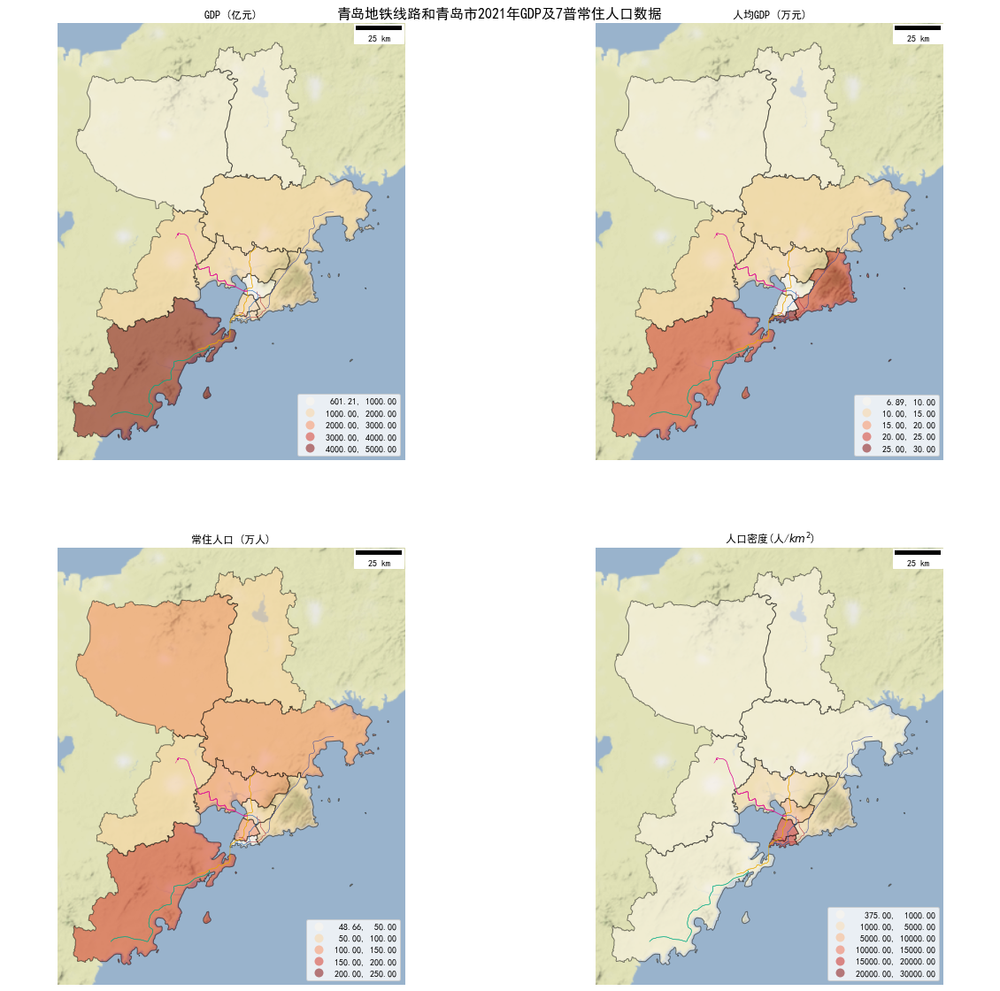

In [37]:
figure = plt.figure(figsize=(20, 20))

plt.title('青岛地铁线路和青岛市2021年GDP及7普常住人口数据', fontsize=16)
plt.axis('off')

axes1 = figure.add_subplot(2,2,1)
axes2 = figure.add_subplot(2,2,2)
axes3 = figure.add_subplot(2,2,3)
axes4 = figure.add_subplot(2,2,4)

#叠加GDP
data_qingdao.plot(ax=axes1, column='GDP', alpha=0.5, edgecolor='k',
                  categorical=False, legend=True, legend_kwds={'loc': 'lower right'},
                  scheme='User_Defined', classification_kwds=dict(bins=[1000,2000,3000,4000,5000]),
                  cmap='OrRd', linewidth=1)

for ctype, data in metro_data_qingdao_all.groupby('name'):
    color = Lines_Palette[ctype]
    data.plot(ax=axes1, color=color, label=ctype, linewidth=0.5)
    
cx.add_basemap(ax=axes1, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)
    
axes1.add_artist(ScaleBar(1))
axes1.axis('off')
axes1.set_title('GDP (亿元)')

#叠加人均GDP
data_qingdao.plot(ax=axes2, column='人均GDP', alpha=0.5, edgecolor='k',
                  categorical=False, legend=True, legend_kwds={'loc': 'lower right'},
                  scheme='User_Defined', classification_kwds={'bins':[10, 15, 20, 25, 30]},
                  cmap='OrRd', linewidth=1)

for ctype, data in metro_data_qingdao_all.groupby('name'):
    color = Lines_Palette[ctype]
    data.plot(ax=axes2, color=color, label=ctype, linewidth=0.5)
    
cx.add_basemap(ax=axes2, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)

axes2.add_artist(ScaleBar(1))
axes2.axis('off')
axes2.set_title('人均GDP (万元)')

#叠加常住人口
data_qingdao.plot(ax=axes3, column='常住人口', alpha=0.5, edgecolor='k',
                  categorical=False, legend=True, legend_kwds={'loc': 'lower right'},
                  scheme='User_Defined', classification_kwds=dict(bins=[50,100,150,200,250]),
                  cmap='OrRd', linewidth=1)

for ctype, data in metro_data_qingdao_all.groupby('name'):
    color = Lines_Palette[ctype]
    data.plot(ax=axes3, color=color, label=ctype, linewidth=0.5)
    
cx.add_basemap(ax=axes3, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)

axes3.add_artist(ScaleBar(1))
axes3.axis('off')
axes3.set_title('常住人口 (万人)')

#叠加人口密度
data_qingdao.plot(ax=axes4, column='人口密度', alpha=0.5, edgecolor='k',
                  categorical=False, legend=True, legend_kwds={'loc': 'lower right'},
                  scheme='User_Defined', classification_kwds=dict(bins=[1000,5000,10000,15000,20000, 30000]),
                  cmap='OrRd', linewidth=1)

for ctype, data in metro_data_qingdao_all.groupby('name'):
    color = Lines_Palette[ctype]
    data.plot(ax=axes4, color=color, label=ctype, linewidth=0.5)
    
cx.add_basemap(ax=axes4, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)

axes4.add_artist(ScaleBar(1))
axes4.axis('off')
axes4.set_title('人口密度(人/$km^2$)')

figure.savefig('青岛地铁4-1.png', pad_inches=0, bbox_inches='tight', dpi=300)

### 05 地铁站点标注

In [38]:
metro_stations = gpd.read_file('gis_osm_transport_free_1.shp').to_crs('EPSG:3857')

In [39]:
metro_data_qingdao_stations = gpd.clip(metro_stations, geo_data_qingdao)
metro_data_qingdao_stations['fclass'].unique()

array(['railway_station', 'bus_stop', 'bus_station', 'taxi',
       'ferry_terminal', 'helipad', 'tram_stop'], dtype=object)

In [40]:
metro_data_qingdao_stations = metro_data_qingdao_stations[metro_data_qingdao_stations['fclass'] == 'railway_station']

In [41]:
metro_data_qingdao_stations

,osm_id,code,fclass,name,geometry
63633,6182217383,5601,railway_station,琅琊,POINT (13343870.245 4255432.876)
63632,6182217382,5601,railway_station,贡口湾,POINT (13339657.236 4256226.070)
63634,6182217384,5601,railway_station,龙湾,POINT (13346881.214 4258078.896)
117037,9242869575,5601,railway_station,肖家贡村,POINT (13330835.100 4248580.837)
84547,8093918592,5601,railway_station,董家口南,POINT (13330406.397 4253199.616)
...,...,...,...,...,...
78437,7721237366,5601,railway_station,夏格庄,POINT (13407474.918 4390610.321)
28701,3914214623,5601,railway_station,莱西南,POINT (13415439.337 4412468.284)
63755,6210802486,5601,railway_station,莱西,POINT (13416823.773 4414472.177)
57897,5579085311,5601,railway_station,浦里,POINT (13427749.848 4342852.544)


添加地铁站点标注后，需要根据字体重叠情况对画布大小和标注字体字号进行调整，以便尽可能消除站点名称的重叠现象。

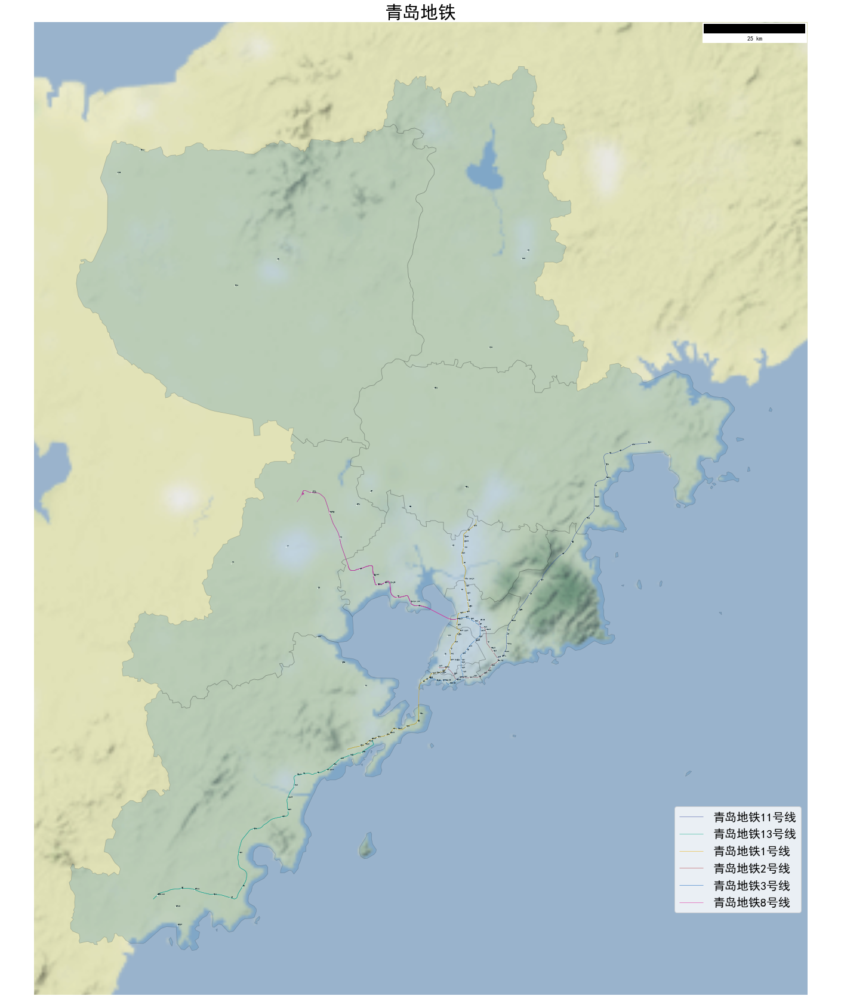

In [42]:
figure = plt.figure(figsize=(25, 30))

plt.title('青岛地铁', fontsize=30)
plt.axis('off')

axes1 = figure.add_subplot(1,1,1)
axes1.axis('off')

geo_data_qingdao.plot(ax=axes1, alpha=0.2, edgecolor='k', linewidth=0.7, zorder=5)

for ctype, data in metro_data_qingdao_all.groupby('name'):
    
    # Define the color for each group using the dictionary
    color = Lines_Palette[ctype]
    
    # Plot each group using the color defined above
    data.plot(ax=axes1, color=color, label=ctype, linewidth=0.5)

metro_data_qingdao_stations.plot(ax=axes1, marker='*', markersize=0.2, color='white', zorder=10)
for x, y, label in zip(metro_data_qingdao_stations.geometry.x, metro_data_qingdao_stations.geometry.y,
                       metro_data_qingdao_stations.name):
    axes1.annotate(label, xy=(x, y), xytext=(1,1), textcoords='offset points', fontsize=2)
    
axes1.legend(bbox_to_anchor=(1.0, 0.2), prop={'size': 20})
axes1.add_artist(ScaleBar(1))

cx.add_basemap(ax=axes1, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)

figure.savefig('青岛地铁5-0.png', pad_inches=0, bbox_inches='tight', dpi=500)

我们看到上图存在许多并不属于地铁站的国铁火车站，因此我们可以先保存图片然后人肉进行逐个站点的清除。以下分别用`metro_data_qingdao_stations_railway`和`metro_data_qingdao_stations_subway`表示国铁和地铁车站。

In [43]:
metro_data_qingdao_stations_railway = pd.read_excel('metro_qingdao_station~.xlsx')
metro_data_qingdao_stations_railway

,station
0,新河园
1,平度
2,平度西
3,平度北
4,莱西
5,莱西南
6,夏格庄
7,姜家坡
8,蓝村
9,即墨


In [44]:
metro_data_qingdao_stations_railway_list = metro_data_qingdao_stations_railway['station'].tolist()
metro_data_qingdao_stations_railway_list

['新河园',
 '平度',
 '平度西',
 '平度北',
 '莱西',
 '莱西南',
 '夏格庄',
 '姜家坡',
 '蓝村',
 '即墨',
 '即墨北',
 '蓝村西',
 '胶州',
 '营海',
 '青岛机场',
 '胶西',
 '胶州北',
 '洋河口',
 '红石崖',
 '黄岛',
 '董家口',
 '董家口南',
 '肖家贡村',
 '城阳',
 '娄山',
 '青岛北',
 '沙岭庄',
 '四方',
 '青岛',
 '红岛']

In [45]:
#metro_data_qingdao_stations = metro_data_qingdao_stations.loc[~metro_data_qingdao_stations.name.isin(metro_data_qingdao_stations_railway_list)]
metro_data_qingdao_stations_subway = metro_data_qingdao_stations.query('@metro_data_qingdao_stations_railway_list not in name')

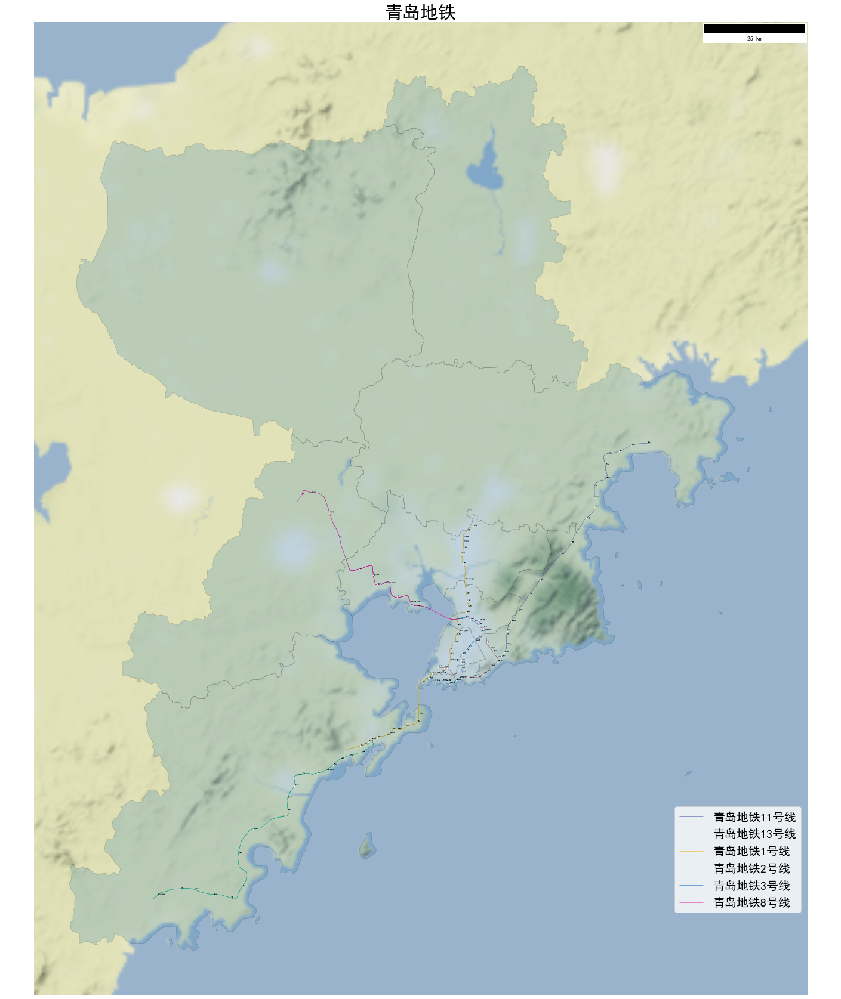

In [46]:
figure = plt.figure(figsize=(25, 30))

plt.title('青岛地铁', fontsize=30)
plt.axis('off')

axes1 = figure.add_subplot(1,1,1)
axes1.axis('off')

geo_data_qingdao.plot(ax=axes1, alpha=0.2, edgecolor='k', linewidth=0.7, zorder=5)

for ctype, data in metro_data_qingdao_all.groupby('name'):
    
    # Define the color for each group using the dictionary
    color = Lines_Palette[ctype]
    
    # Plot each group using the color defined above
    data.plot(ax=axes1, color=color, label=ctype, linewidth=0.5)

metro_data_qingdao_stations_subway.plot(ax=axes1, marker='*', markersize=0.2, color='white', zorder=10)
for x, y, label in zip(metro_data_qingdao_stations_subway.geometry.x, metro_data_qingdao_stations_subway.geometry.y,
                       metro_data_qingdao_stations_subway.name):
    axes1.annotate(label, xy=(x, y), xytext=(1,1), textcoords='offset points', fontsize=2)
    
axes1.legend(bbox_to_anchor=(1.0, 0.2), prop={'size': 20})
axes1.add_artist(ScaleBar(1))

cx.add_basemap(ax=axes1, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)

figure.savefig('青岛地铁5-1.png', pad_inches=0, bbox_inches='tight', dpi=500)

### 06 坐标转换

当我们将画布扩大后，可以明显看到`青岛市.geojson`文件即青岛市区划范围与底图相比存在肉眼可见的坐标偏移，因此我们需要对其进行坐标转换，为此我们需要[coord_covert](https://pypi.org/project/coord-convert/)库，安装后可在`青岛市.geojson`所在目录下用命令行执行`coord_covert gcj2wgs 青岛市.geojson 青岛市-WGS-84.geojson`进行转换。

In [47]:
geo_data_qingdao = gpd.read_file('青岛市-WGS-84.geojson').to_crs('EPSG:3857')

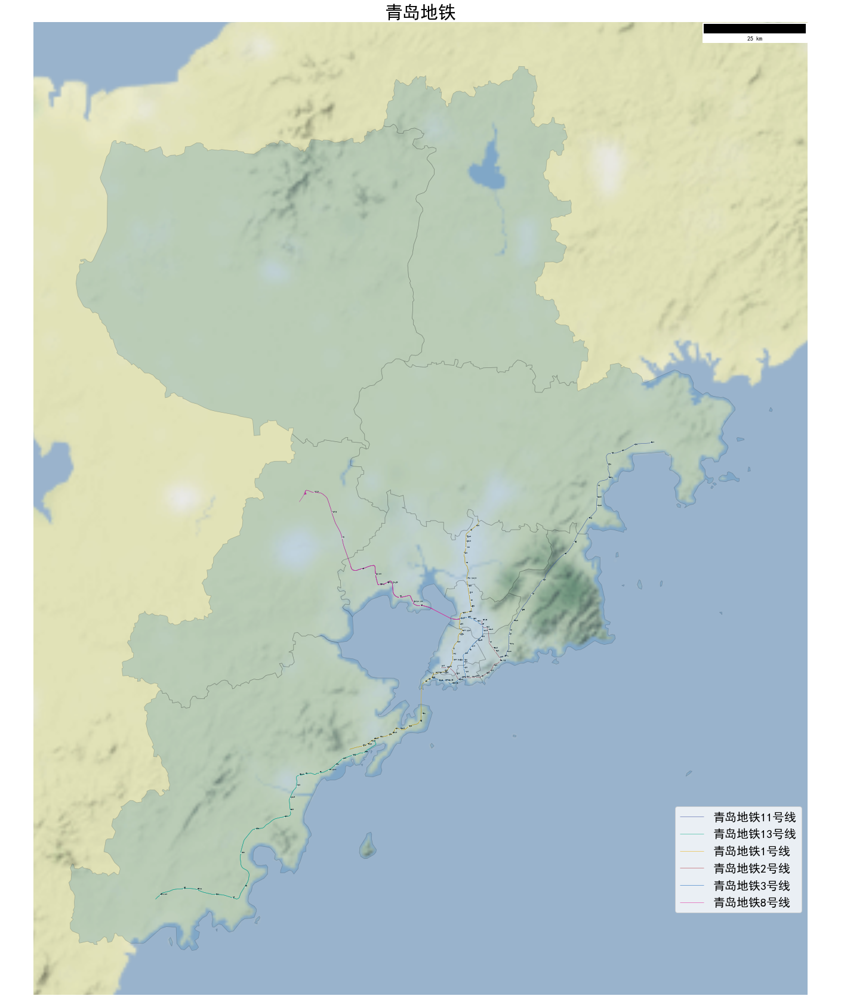

In [48]:
figure = plt.figure(figsize=(25, 30))

plt.title('青岛地铁', fontsize=30)
plt.axis('off')

axes1 = figure.add_subplot(1,1,1)
axes1.axis('off')

geo_data_qingdao.plot(ax=axes1, alpha=0.2, edgecolor='k', linewidth=0.7, zorder=5)

for ctype, data in metro_data_qingdao_all.groupby('name'):
    
    # Define the color for each group using the dictionary
    color = Lines_Palette[ctype]
    
    # Plot each group using the color defined above
    data.plot(ax=axes1, color=color, label=ctype, linewidth=0.5)

metro_data_qingdao_stations_subway.plot(ax=axes1, marker='*', markersize=0.2, color='white', zorder=10)
for x, y, label in zip(metro_data_qingdao_stations_subway.geometry.x, metro_data_qingdao_stations_subway.geometry.y,
                       metro_data_qingdao_stations_subway.name):
    axes1.annotate(label, xy=(x, y), xytext=(1,1), textcoords='offset points', fontsize=2)
    
axes1.legend(bbox_to_anchor=(1.0, 0.2), prop={'size': 20})
axes1.add_artist(ScaleBar(1))

cx.add_basemap(ax=axes1, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)

figure.savefig('青岛地铁6.png', pad_inches=0, bbox_inches='tight', dpi=500)

叠加`zoom=10`的底图

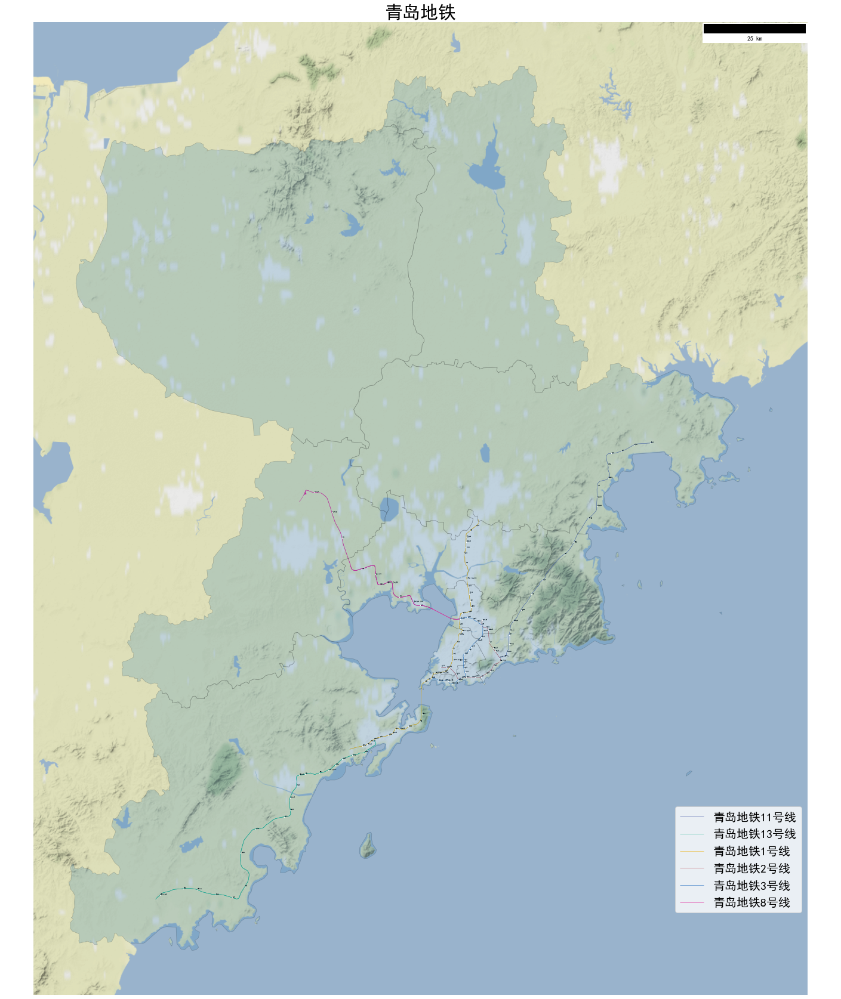

In [49]:
figure = plt.figure(figsize=(25, 30))

plt.title('青岛地铁', fontsize=30)
plt.axis('off')

axes1 = figure.add_subplot(1,1,1)
axes1.axis('off')

geo_data_qingdao.plot(ax=axes1, alpha=0.2, edgecolor='k', linewidth=0.7, zorder=5)

for ctype, data in metro_data_qingdao_all.groupby('name'):
    
    # Define the color for each group using the dictionary
    color = Lines_Palette[ctype]
    
    # Plot each group using the color defined above
    data.plot(ax=axes1, color=color, label=ctype, linewidth=0.5)

metro_data_qingdao_stations_subway.plot(ax=axes1, marker='*', markersize=0.2, color='white', zorder=10)
for x, y, label in zip(metro_data_qingdao_stations_subway.geometry.x, metro_data_qingdao_stations_subway.geometry.y,
                       metro_data_qingdao_stations_subway.name):
    axes1.annotate(label, xy=(x, y), xytext=(1,1), textcoords='offset points', fontsize=2)
    
axes1.legend(bbox_to_anchor=(1.0, 0.2), prop={'size': 20})
axes1.add_artist(ScaleBar(1))

cx.add_basemap(ax=axes1, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=10)

figure.savefig('青岛地铁6-zl10.png', pad_inches=0, bbox_inches='tight', dpi=500)

叠加`OpenStreetMap`底图

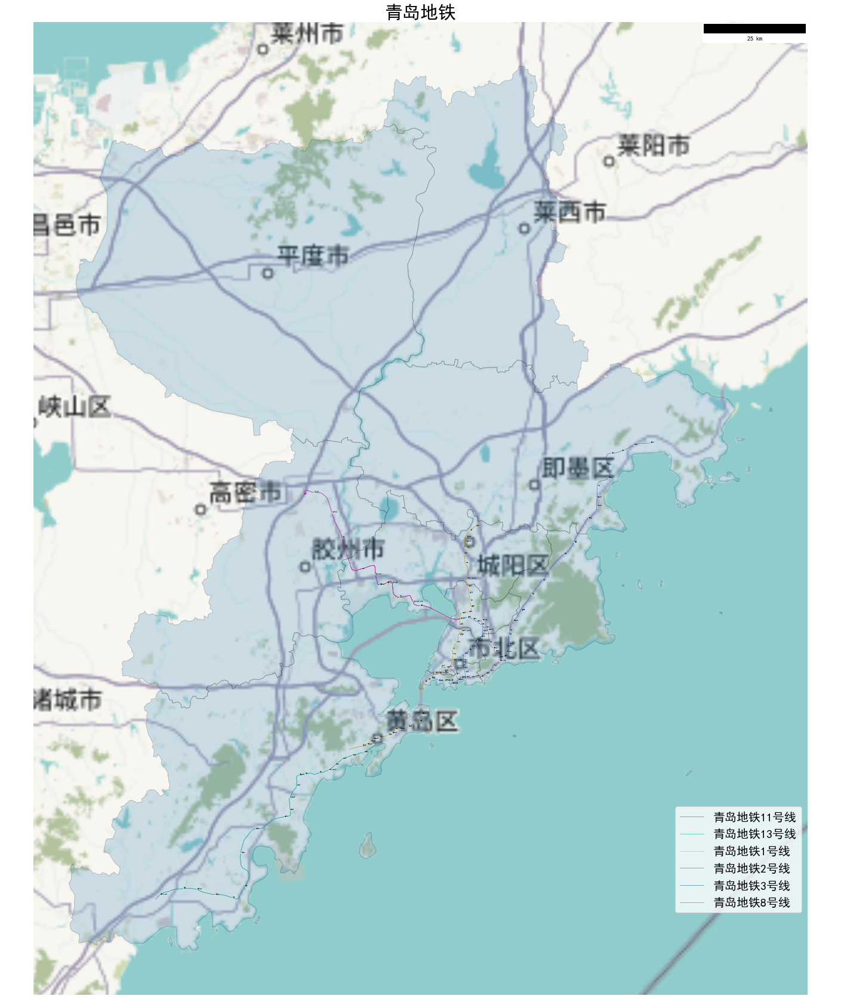

In [50]:
figure = plt.figure(figsize=(25, 30))

plt.title('青岛地铁', fontsize=30)
plt.axis('off')

axes1 = figure.add_subplot(1,1,1)
axes1.axis('off')

geo_data_qingdao.plot(ax=axes1, alpha=0.2, edgecolor='k', linewidth=1, zorder=5)

for ctype, data in metro_data_qingdao_all.groupby('name'):

    # Define the color for each group using the dictionary
    color = Lines_Palette[ctype]

    # Plot each group using the color defined above
    data.plot(ax=axes1, color=color, label=ctype, linewidth=0.5)

metro_data_qingdao_stations_subway.plot(ax=axes1, marker='*', markersize=0.2, color='white', zorder=10)
for x, y, label in zip(metro_data_qingdao_stations_subway.geometry.x, metro_data_qingdao_stations_subway.geometry.y,
                       metro_data_qingdao_stations_subway.name):
    axes1.annotate(label, xy=(x, y), xytext=(1,1), textcoords='offset points', fontsize=2)

axes1.legend(bbox_to_anchor=(1.0, 0.2), prop={'size': 20})
axes1.add_artist(ScaleBar(1))

cx.add_basemap(ax=axes1, source='https://{s}.tile.openstreetmap.fr/hot/{z}/{x}/{y}.png', zoom=8)

figure.savefig('青岛地铁6-osm.png', pad_inches=0, bbox_inches='tight', dpi=500)

### 番外

下面我们通过客流演示数据，用客流强度对线路`linewidth`分别赋值。

In [51]:
metro_qingdao_pop = pd.read_excel('metro_qingdao_pop.xlsx')
metro_qingdao_pop

,Lines,Line_width,pop,length,Line_width_
0,青岛地铁1号线,2.4,23.0,60.11,0.38
1,青岛地铁2号线,3.0,29.0,25.09,1.16
2,青岛地铁3号线,3.0,29.0,24.95,1.16
3,青岛地铁4号线,0.0,NaN,NaN,NaN
4,青岛地铁5号线,0.0,NaN,NaN,NaN
5,青岛地铁6号线,0.0,NaN,NaN,NaN
6,青岛地铁7号线,0.0,NaN,NaN,NaN
7,青岛地铁8号线,0.4,4.0,49.61,0.08
8,青岛地铁9号线,0.0,NaN,NaN,NaN
9,青岛地铁10号线,0.0,NaN,NaN,NaN


In [52]:
Lines_Width = dict([(i,a) for i,a in zip(metro_qingdao_pop['Lines'], metro_qingdao_pop['Line_width_'])])
Lines_Width

{'青岛地铁1号线': 0.38,
 '青岛地铁2号线': 1.16,
 '青岛地铁3号线': 1.16,
 '青岛地铁4号线': nan,
 '青岛地铁5号线': nan,
 '青岛地铁6号线': nan,
 '青岛地铁7号线': nan,
 '青岛地铁8号线': 0.08,
 '青岛地铁9号线': nan,
 '青岛地铁10号线': nan,
 '青岛地铁11号线': 0.09,
 '青岛地铁12号线': nan,
 '青岛地铁13号线': 0.09,
 '青岛地铁14号线': nan,
 '青岛地铁15号线': nan,
 '青岛地铁16号线': 0.34}

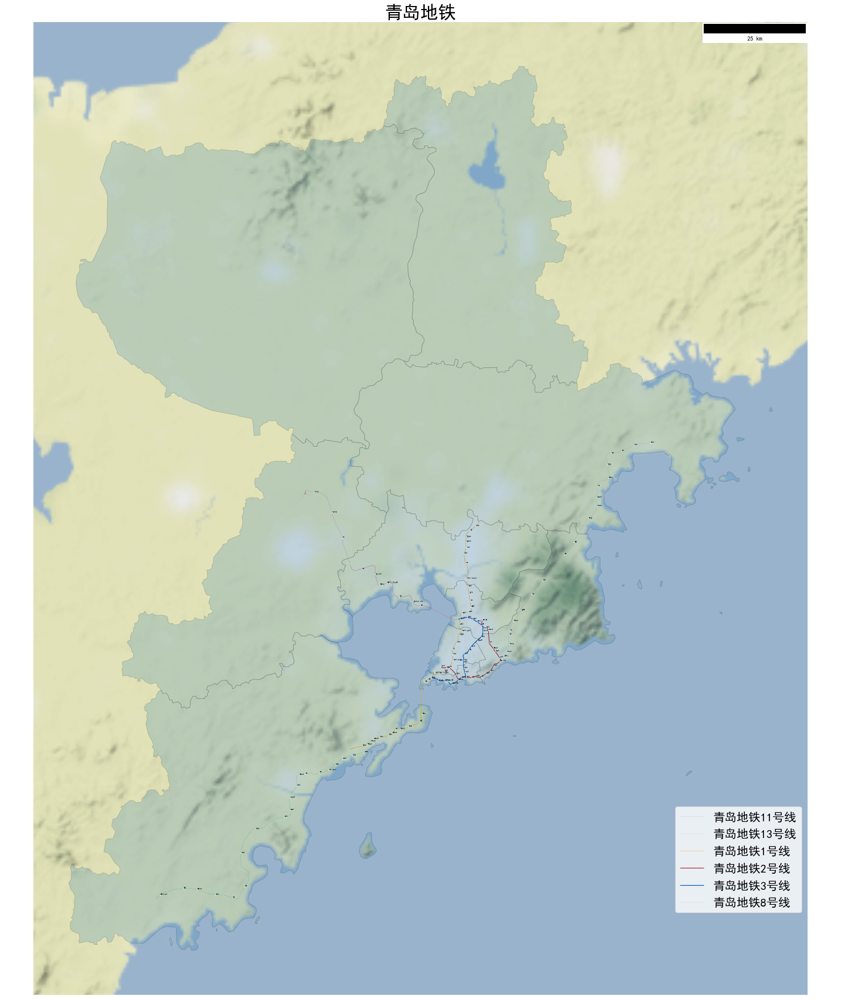

In [53]:
figure = plt.figure(figsize=(25, 30))

plt.title('青岛地铁', fontsize=30)
plt.axis('off')

axes1 = figure.add_subplot(1,1,1)
axes1.axis('off')

geo_data_qingdao.plot(ax=axes1, alpha=0.2, edgecolor='k', linewidth=0.7, zorder=5)

for ctype, data in metro_data_qingdao_all.groupby('name'):
    
    # Define the color for each group using the dictionary
    color = Lines_Palette[ctype]
    
    # Plot each group using the color defined above
    data.plot(ax=axes1, color=color, label=ctype,
             # Assign each group to a line width using the dictionary created above
              linewidth=Lines_Width[ctype])

metro_data_qingdao_stations_subway.plot(ax=axes1, marker='*', markersize=0.2, color='white', zorder=10)
for x, y, label in zip(metro_data_qingdao_stations_subway.geometry.x, metro_data_qingdao_stations_subway.geometry.y,
                       metro_data_qingdao_stations_subway.name):
    axes1.annotate(label, xy=(x, y), xytext=(1,1), textcoords='offset points', fontsize=2)
    
axes1.legend(bbox_to_anchor=(1.0, 0.2), prop={'size': 20})
axes1.add_artist(ScaleBar(1))

cx.add_basemap(ax=axes1, source='https://stamen-tiles-a.a.ssl.fastly.net/terrain-background/{z}/{x}/{y}.png', zoom=8)

figure.savefig('青岛地铁-sideshow.png', pad_inches=0, bbox_inches='tight', dpi=500)